In [189]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [190]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
pd.set_option("display.max_colwidth", None)

# Importar la data

In [331]:
df_paises = pd.read_parquet('life-expectancy/datasets/df_locationsWithAggregates.parquet')
df_esperanza_vida_nacer = pd.read_parquet('life-expectancy/datasets/df_TWB_SP.DYN.LE00.IN.parquet')
df_fertilidad = pd.read_parquet('life-expectancy/datasets/df_UNPD_fert_19.parquet')
df_migraciones = pd.read_parquet('life-expectancy/datasets/df_UNPD_imigrt_65.parquet')
df_tasa_migraciones = pd.read_parquet('life-expectancy/datasets/df_UNPD_imigrt_66.parquet')
df_matrimonios = pd.read_parquet('life-expectancy/datasets/df_UNPD_marstat_42.parquet')
df_mortalidad_infantil_05 = pd.read_parquet('life-expectancy/datasets/df_UNPD_mort_24.parquet')
df_mortalidad_infantil_01 = pd.read_parquet('life-expectancy/datasets/df_UNPD_mort_22.parquet')
df_met_concep = pd.read_parquet('life-expectancy/datasets/df_UNPD_fam_1.parquet')

In [407]:
df_ninios_anemia = pd.read_parquet('life-expectancy/datasets/df_OMS_NUTRITION_ANAEMIA_CHILDREN_PREV.parquet')
df_mujeres_anemia = pd.read_parquet('life-expectancy/datasets/df_OMS_NUTRITION_ANAEMIA_REPRODUCTIVEAGE_PREV.parquet')
df_consumo_cigarro = pd.read_parquet('life-expectancy/datasets/df_OMS_M_Est_cig_curr.parquet')
df_consumo_alcohol = pd.read_parquet('life-expectancy/datasets/df_OMS_SA_0000001688.parquet')
df_obesidad = pd.read_parquet('life-expectancy/datasets/df_OMS_NCD_BMI_30A.parquet')

# Renombrar a las columnas

In [337]:
df_paises = df_paises.rename(columns = {'WorldBankIncomeGroup':'nivel_ingresos'})
df_esperanza_vida_nacer = df_esperanza_vida_nacer.rename(columns = {'countryiso3code':'Iso3', 'value': 'esperanza_vida_nacer', 'country.value':'pais', 'date':'año', 'indicator.value':"indicador", "indicator.id": "id_indicador" })
df_fertilidad = df_fertilidad.rename(columns = {'iso3':'Iso3', 'value': 'tasa_hijos(cant)', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})
df_migraciones = df_migraciones.rename(columns = {'iso3':'Iso3', 'value': 'migracion_neta', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})
df_tasa_migraciones = df_tasa_migraciones.rename(columns = {'iso3':'Iso3', 'value': 'tasa_migracion(per1000)', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})
df_mortalidad_infantil_01 = df_mortalidad_infantil_01.rename(columns = {'iso3':'Iso3', 'value': 'tasa_mort_inf_1(per1000)', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})
df_mortalidad_infantil_05 = df_mortalidad_infantil_05.rename(columns = {'iso3':'Iso3', 'value': 'tasa_mort_inf_5(per1000)', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})
df_matrimonios = df_matrimonios.rename(columns = {'iso3':'Iso3', 'value': 'tasa_matrimonios(%)', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})
df_met_concep = df_met_concep.rename(columns = {'iso3':'Iso3', 'value': 'tasa_uso_met_concep(%)', 'location': 'pais', 'timeLabel': 'año', 'indicator':'indicador', 'indicatorId':'id_indicador'})

In [408]:
df_ninios_anemia = df_ninios_anemia.rename(columns = {'SpatialDim':'Iso3', 'NumericValue': 'tasa_anemia_niños(%)', 'IndicatorCode':'indicador', 'TimeDimensionValue': 'año', 'Dim1' : 'genero'})
df_mujeres_anemia = df_mujeres_anemia.rename(columns = {'SpatialDim':'Iso3', 'NumericValue': 'tasa_anemia_mujeres(%)', 'IndicatorCode':'indicador', 'TimeDimensionValue': 'año', 'Dim1' : 'genero'})
df_consumo_alcohol = df_consumo_alcohol.rename(columns = {'SpatialDim':'Iso3', 'NumericValue': 'tasa_consumo_alcohol(L)', 'IndicatorCode':'indicador', 'TimeDim': 'año', 'Dim1' : 'genero'})
df_consumo_cigarro = df_consumo_cigarro.rename(columns = {'SpatialDim':'Iso3', 'NumericValue': 'tasa_consumo_cigarro(%)', 'IndicatorCode':'indicador', 'TimeDim': 'año', 'Dim1' : 'genero'})
df_obesidad = df_obesidad.rename(columns = {'SpatialDim':'Iso3', 'NumericValue': 'tasa_obesidad_pob(%)', 'IndicatorCode':'indicador', 'TimeDimensionValue': 'año', 'Dim1' : 'genero'})

### Limpieza de la tabla esperanza de vida al nacer

In [ ]:
df_esperanza_vida_nacer = df_esperanza_vida_nacer[df_esperanza_vida_nacer['año'] != '2021']
df_esperanza_vida_nacer = df_esperanza_vida_nacer[['Iso3', 'pais', 'año', 'esperanza_vida_nacer', 'id_indicador', 'indicador']]

# Crear una columna para hacer el merge

In [352]:
df_esperanza_vida_nacer['codigo_union']= df_esperanza_vida_nacer["Iso3"] + df_esperanza_vida_nacer["año"]
df_fertilidad['codigo_union']= df_fertilidad["Iso3"] + df_fertilidad["año"]
df_migraciones['codigo_union']= df_migraciones["Iso3"] + df_migraciones["año"]
df_tasa_migraciones['codigo_union']= df_tasa_migraciones["Iso3"] + df_tasa_migraciones["año"]
df_mortalidad_infantil_01['codigo_union']= df_mortalidad_infantil_01["Iso3"] + df_mortalidad_infantil_01["año"]
df_mortalidad_infantil_05['codigo_union']= df_mortalidad_infantil_05["Iso3"] + df_mortalidad_infantil_05["año"]
df_matrimonios['codigo_union']= df_matrimonios["Iso3"] + df_matrimonios["año"]
df_met_concep['codigo_union']= df_met_concep["Iso3"] + df_met_concep["año"]

In [409]:
# el ano esta en float 
df_consumo_alcohol = df_consumo_alcohol.dropna(how='all')
df_consumo_cigarro = df_consumo_cigarro.dropna(how='all')
df_consumo_alcohol["año"]=df_consumo_alcohol["año"].astype(int)
df_consumo_cigarro["año"]=df_consumo_cigarro["año"].astype(int)

In [410]:
df_ninios_anemia['codigo_union']= df_ninios_anemia["Iso3"] + df_ninios_anemia["año"]
df_mujeres_anemia['codigo_union']= df_mujeres_anemia["Iso3"] + df_mujeres_anemia["año"]
df_obesidad['codigo_union']= df_obesidad["Iso3"] +df_obesidad["año"]
df_consumo_alcohol['codigo_union']= df_consumo_alcohol["Iso3"] +df_consumo_alcohol["año"].astype(str)
df_consumo_cigarro['codigo_union']= df_consumo_cigarro["Iso3"] +df_consumo_cigarro["año"].astype(str)

### Verificar los paises que no tienen datos de esperanza de vida

In [199]:
paises_sindata_evn = pd.merge(df_esperanza_vida_nacer, df_paises[['Iso3','nivel_ingresos','Name']], how='outer', on='Iso3')
paises_sindata_evn = paises_sindata_evn[paises_sindata_evn.date.isnull()]

# Juntar los valores de las tablas en una sola tabla

In [363]:
tabla_general = pd.merge(df_esperanza_vida_nacer, df_paises[['Iso3','nivel_ingresos']], how='left', on='Iso3')
tabla_general = pd.merge(tabla_general, df_fertilidad[['codigo_union','tasa_hijos(cant)']], how='left', on='codigo_union')
tabla_general = pd.merge(tabla_general, df_migraciones[['codigo_union','migracion_neta']], how='left', on='codigo_union')
tabla_general = pd.merge(tabla_general, df_tasa_migraciones[['codigo_union','tasa_migracion(per1000)']], how='left', on='codigo_union')
tabla_general = pd.merge(tabla_general, df_matrimonios[['codigo_union','tasa_matrimonios(%)']], how='left', on='codigo_union')
tabla_general = pd.merge(tabla_general,df_mortalidad_infantil_01.loc[(df_mortalidad_infantil_01["sex"] == "Both sexes"),['codigo_union','tasa_mort_inf_1(per1000)']], how='left', on='codigo_union')
tabla_general = pd.merge(tabla_general,df_mortalidad_infantil_05.loc[(df_mortalidad_infantil_05["sex"] == "Both sexes"),['codigo_union','tasa_mort_inf_5(per1000)']], how='left', on='codigo_union')
tabla_general = pd.merge(tabla_general, df_met_concep[['codigo_union','tasa_uso_met_concep(%)']], how='left', on='codigo_union')

In [367]:
tabla_general = tabla_general[~(tabla_general.nivel_ingresos.isnull())]

In [368]:
tabla_general['codigo_NI'] = tabla_general['nivel_ingresos']
tabla_general.loc[tabla_general.nivel_ingresos == 'No income group available','codigo_NI']=0
tabla_general.loc[tabla_general.nivel_ingresos == 'Low-income countries','codigo_NI']=1
tabla_general.loc[tabla_general.nivel_ingresos == 'Lower-middle-income countries','codigo_NI']=2
tabla_general.loc[tabla_general.nivel_ingresos == 'Upper-middle-income countries','codigo_NI']=3
tabla_general.loc[tabla_general.nivel_ingresos == 'High-income countries','codigo_NI']=4
tabla_general['codigo_NI'] = tabla_general['codigo_NI'].astype(int)
tabla_general.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6510 entries, 1519 to 8245
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Iso3                      6510 non-null   object 
 1   pais                      6510 non-null   object 
 2   año                       6510 non-null   int32  
 3   esperanza_vida_nacer      5973 non-null   float64
 4   id_indicador              6510 non-null   object 
 5   indicador                 6510 non-null   object 
 6   codigo_union              6510 non-null   object 
 7   nivel_ingresos            6510 non-null   object 
 8   tasa_hijos(cant)          6510 non-null   float64
 9   migracion_neta            6510 non-null   float64
 10  tasa_migracion(per1000)   6510 non-null   float64
 11  tasa_matrimonios(%)       6355 non-null   float64
 12  tasa_mort_inf_1(per1000)  6510 non-null   float64
 13  tasa_mort_inf_5(per1000)  6510 non-null   float64
 14  tasa_

C:\Users\Mariel\AppData\Local\Temp\ipykernel_6720\1654418886.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla_general['codigo_NI'] = tabla_general['nivel_ingresos']
C:\Users\Mariel\AppData\Local\Temp\ipykernel_6720\1654418886.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla_general['codigo_NI'] = tabla_general['codigo_NI'].astype(int)


In [412]:
tabla_general_OMS = pd.merge(tabla_general,df_ninios_anemia.loc[(df_ninios_anemia["genero"] == "BTSX"),['codigo_union','tasa_anemia_niños(%)']], how='left', on='codigo_union')
tabla_general_OMS = pd.merge(tabla_general_OMS,df_mujeres_anemia.loc[(df_mujeres_anemia["genero"] == "FMLE"),['codigo_union','tasa_anemia_mujeres(%)']], how='left', on='codigo_union')
tabla_general_OMS = pd.merge(tabla_general_OMS,df_obesidad.loc[(df_obesidad["genero"] == "BTSX"),['codigo_union','tasa_obesidad_pob(%)']], how='left', on='codigo_union')
tabla_general_OMS = pd.merge(tabla_general_OMS,df_consumo_alcohol.loc[(df_consumo_alcohol["genero"] == "BTSX"),['codigo_union','tasa_consumo_alcohol(L)']], how='outer', on='codigo_union')
tabla_general_OMS = pd.merge(tabla_general_OMS,df_consumo_cigarro.loc[(df_consumo_cigarro["genero"] == "BTSX"),['codigo_union','tasa_consumo_cigarro(%)']], how='outer', on='codigo_union')

In [414]:
tabla_general_OMS.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7181 entries, 0 to 7180
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Iso3                      6510 non-null   object 
 1   pais                      6510 non-null   object 
 2   año                       6510 non-null   float64
 3   esperanza_vida_nacer      5973 non-null   float64
 4   id_indicador              6510 non-null   object 
 5   indicador                 6510 non-null   object 
 6   codigo_union              7181 non-null   object 
 7   nivel_ingresos            6510 non-null   object 
 8   tasa_hijos(cant)          6510 non-null   float64
 9   migracion_neta            6510 non-null   float64
 10  tasa_migracion(per1000)   6510 non-null   float64
 11  tasa_matrimonios(%)       6355 non-null   float64
 12  tasa_mort_inf_1(per1000)  6510 non-null   float64
 13  tasa_mort_inf_5(per1000)  6510 non-null   float64
 14  tasa_uso

# Graficas

In [297]:
pd.pivot_table(tabla_general_OMS, 
 index='date', 
 columns='nivel_ingresos', 
 values='esperanza_vida_nacer', 
 aggfunc='mean').head(2)

nivel_ingresos,High-income countries,Low-income countries,Lower-middle-income countries,No income group available,Upper-middle-income countries
date,,,,,
1990,73.658494,49.343643,59.997243,70.658,67.840060
1991,73.880724,49.320857,60.228561,70.811,68.007654


<AxesSubplot:>

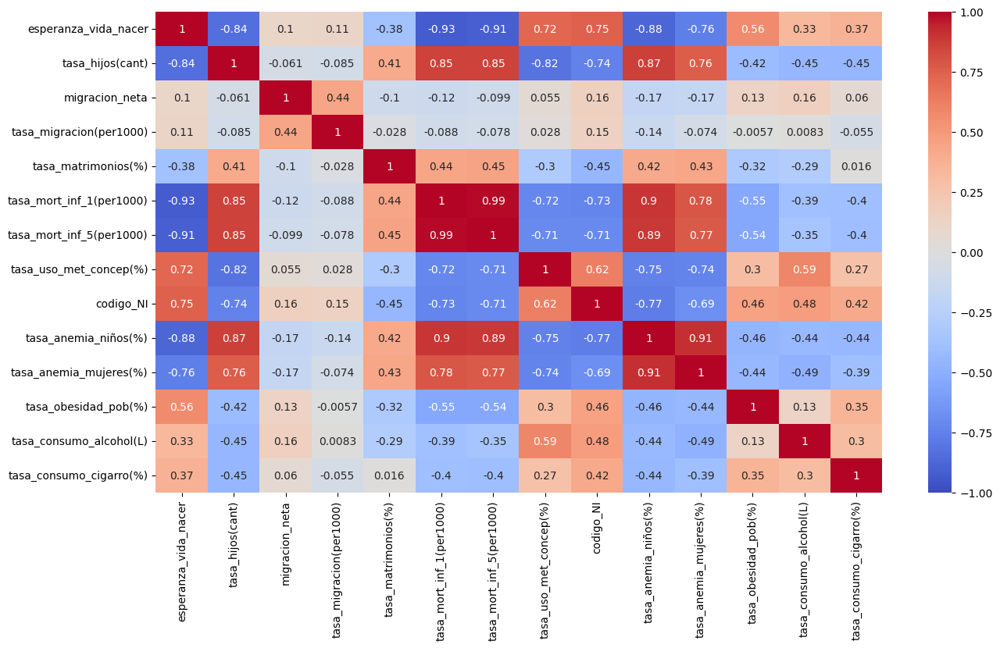

In [416]:
#tabla_general_corr = tabla_general.dropna()
tabla_general_OMS = tabla_general_OMS.drop(columns = "año")
plt.figure(figsize = (15,8))
sns.heatmap(tabla_general_OMS.corr(), vmin = -1, vmax = +1, annot = True, cmap = 'coolwarm')

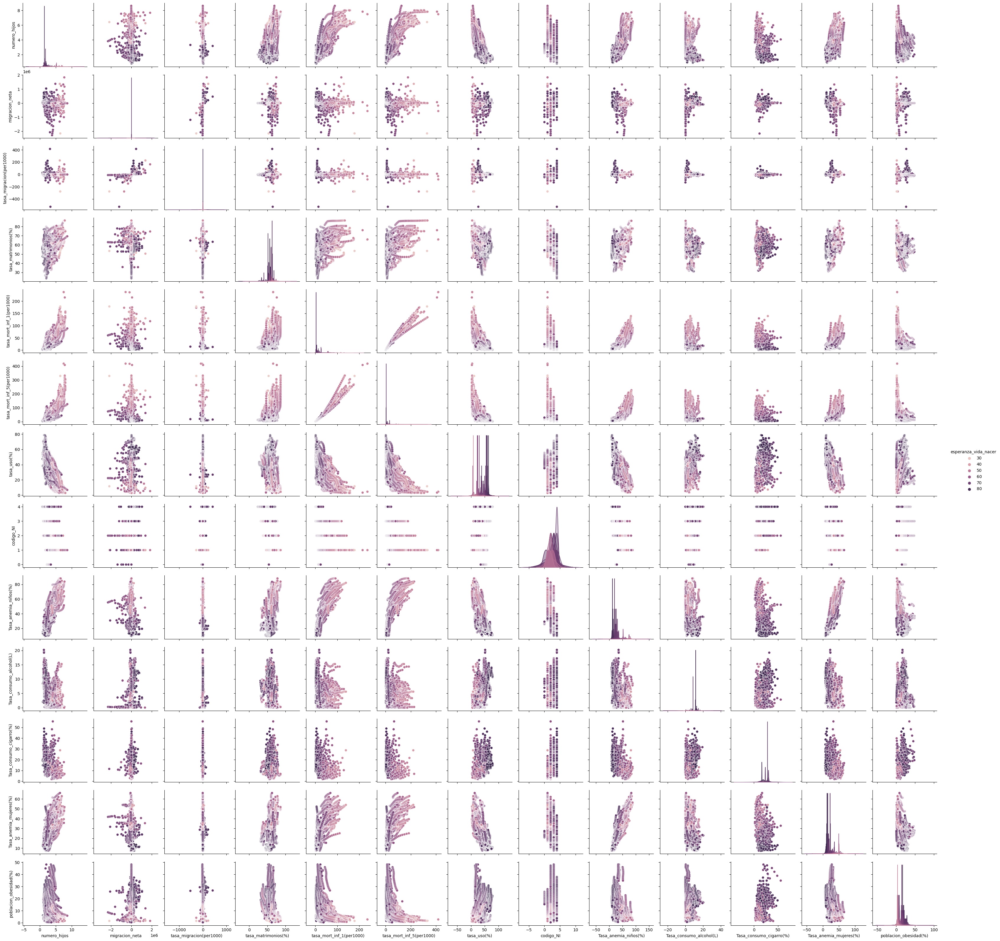

In [289]:
sns.pairplot(tabla_general_OMS, hue="esperanza_vida_nacer")

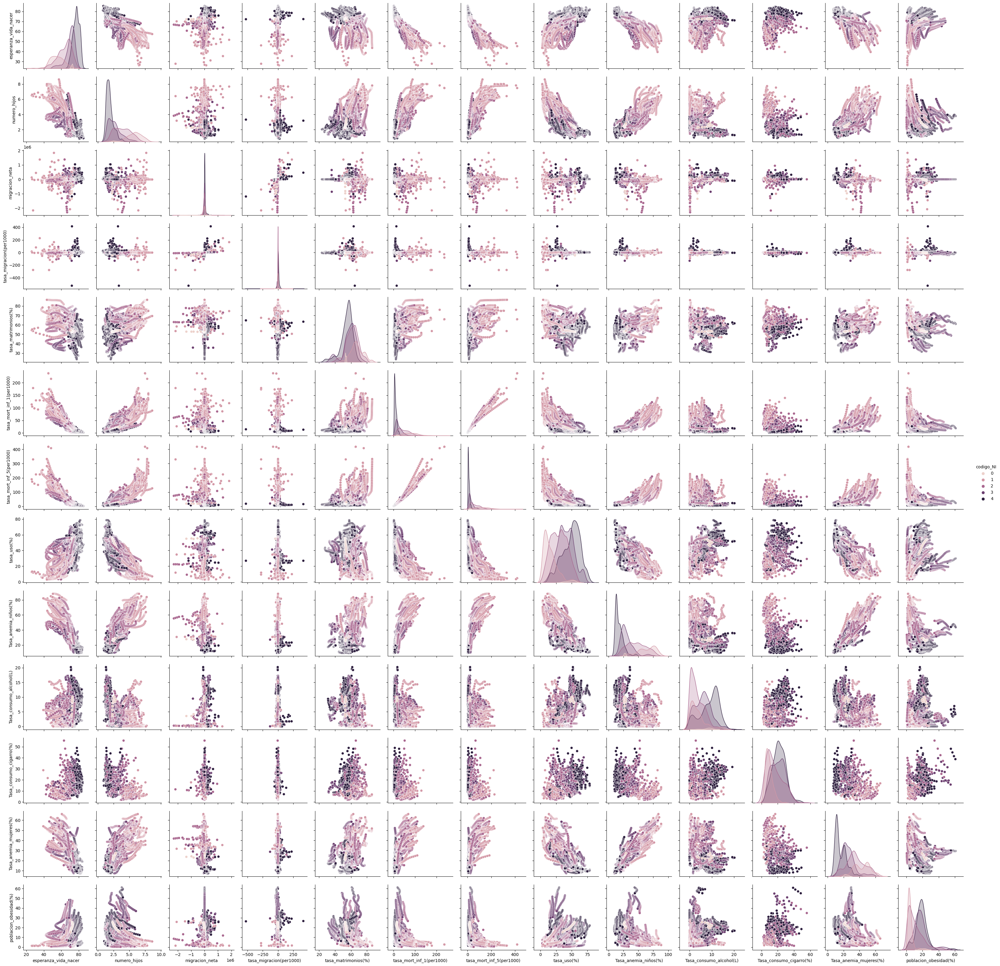

In [290]:
sns.pairplot(tabla_general_OMS, hue="codigo_NI")